# Data Exploration

In [1]:
import numpy as np
import pandas as pd

class ReadData():
    """
    import pandas at first
    Usage:
    df = ReadData(file_name, url).createDF() 
    """
    def __init__(self, file_name, 
                 url = None,
                 org_name = 'good-food', 
                 repo_name = 'datamap2019', 
                 folder_path = '/data/', 
                 mode = 'wb'
                ):
        
        self.file_name = file_name
        self.org_name = org_name
        self.repo_name = repo_name
        self.folder_path = folder_path
        
        self.url = url
        self.mode = mode
        
        self.root_path = 'https://github.com/'
        self.raw_path = 'https://raw.githubusercontent.com/'
        self.branch = 'master'

    def getPath(self):
        if self.url == None:
            path = self.root_path + self.org_name + '/' + self.repo_name + '/blob/' + self.branch + self.folder_path + self.file_name
            raw_path = self.raw_path + self.org_name + '/' + self.repo_name + '/' + self.branch + self.folder_path + self.file_name
            print('Url: ', path)
            print('Raw data:', raw_path)
        else:
            print('Url: ', self.url)
            print('Raw data:', self.url)
        return raw_path

    def curl(self):
        import urllib.request, urllib.parse, urllib.error
        
        url = self.getPath()
        response = urllib.request.urlopen(url).read()
        with open(self.file_name, self.mode) as file_handle:
            file_handle.write(response)

    def delFile(self):
        import os
        if os.path.exists(self.file_name): os.remove(self.file_name)
        else: print('no such file:%s'%self.file_name)

    def createDF(self):
        import time
        print(self.file_name, 'is under dealing... needs 1 min')
        self.curl()
        time.sleep(10)
        df = pd.read_csv(self.file_name)
        self.delFile()
        return df

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

import datetime
year_now = datetime.date.today().year

## Read Datas of Animal Production

### Read Livestock Production Data

In [3]:
item1 = 'product_livestock_cn'
item2 = 'product_livestock_areas'
item3 = 'product_aquatic'

data1 = item1 + '_clean.csv'
data2 = item2 + '_clean.csv'
data3 = item3 + '_clean.csv'

# doc1 def hasn't finish


# ---------------------------------------------------------------------------------------------------------------
# If you haven't cloned the whole repository from [Github](https://github.com/good-food/datamap2019)
# please uncomment and run the top lines.
# ---------------------------------------------------------------------------------------------------------------

# lives_cn = ReadData(data1).createDF()
# lives_areas = ReadData(data2).createDF()
# aquatic = ReadData(data3).createDF()

lives_cn = pd.read_csv('./data/'+data1)
lives_areas = pd.read_csv('./data/'+data2)
aquatic = pd.read_csv('./data/'+data3)

In [4]:
lives_cn.head()

,Domain,Area,Element,Item,Year,Unit,Value,Flag Description
0,Live Animals,China,Stocks,Cattle,1961,10000 Head,4951.4057,"Aggregate, may include official, semi-official..."
1,Live Animals,China,Stocks,Cattle,1962,10000 Head,4687.5560,"Aggregate, may include official, semi-official..."
2,Live Animals,China,Stocks,Cattle,1963,10000 Head,4747.5507,"Aggregate, may include official, semi-official..."
3,Live Animals,China,Stocks,Cattle,1964,10000 Head,4905.6062,"Aggregate, may include official, semi-official..."
4,Live Animals,China,Stocks,Cattle,1965,10000 Head,5253.3452,"Aggregate, may include official, semi-official..."


In [5]:
lives_cn.groupby(['Element', 'Item']).count()

Domain  Area  Year  Unit  \
Element                       Item                                              
Producing Animals/Slaughtered Meat, cattle               57    57    57    57   
                              Meat, chicken              57    57    57    57   
                              Meat, goat                 57    57    57    57   
                              Meat, pig                  57    57    57    57   
                              Meat, sheep                57    57    57    57   
Production                    Eggs, hen, in shell        57    57    57    57   
                              Meat, cattle               57    57    57    57   
                              Meat, chicken              57    57    57    57   
                              Meat, goat                 57    57    57    57   
                              Meat, pig                  57    57    57    57   
                              Meat, sheep                57    57    57    57   
                              Milk, whole fresh cow      57    57    57    57   
Stocks                        Cattle                     57    57    57    57   
                              Chickens                   57    57    57    57   
                              Goats                      57    57    57    57   
                              Pigs                       57    57    57    57   
                              Sheep                      57    57    57    57   
Yield/Carcass Weight          Meat, cattle               57    57    57    57   
                              Meat, chicken              57    57    57    57   
                              Meat, goat                 57    57    57    57   
                              Meat, pig                  57    57    57    57   
                              Meat, sheep                57    57    57    57   

                                                     Value  Flag Description  
Element                       Item                                            
Producing Animals/Slaughtered Meat, cattle              57                57  
                              Meat, chicken             57                57  
                              Meat, goat                57                57  
                              Meat, pig                 57                57  
                              Meat, sheep               57                57  
Production                    Eggs, hen, in shell       57                57  
                              Meat, cattle              57                57  
                              Meat, chicken             57                57  
                              Meat, goat                57                57  
                              Meat, pig                 57                57  
                              Meat, sheep               57                57  
                              Milk, whole fresh cow     57                57  
Stocks                        Cattle                    57                57  
                              Chickens                  57                57  
                              Goats                     57                57  
                              Pigs                      57                57  
                              Sheep                     57                57  
Yield/Carcass Weight          Meat, cattle              57                57  
                              Meat, chicken             57                57  
                              Meat, goat                57                57  
                              Meat, pig                 57                57  
                              Meat, sheep               57                57

In [6]:
lives_areas.columns

Index(['Area', 'Year', 'Stock_largeAni', 'Stock_cattle', 'Stock_horse',
       'Stock_donkey', 'Stock_mule', 'Stock_camel', 'Slau_pig', 'Stock_pig',
       'Stock_gt_shp', 'Stock_goat', 'Stock_sheep', 'Slau_cattle',
       'Slau_gt_shp', 'Slau_poultry', 'MeatProd', 'MeatProd_hg_ct_gt_shp',
       'MeatProd_pig', 'MeatProd_cattle', 'MeatProd_gt_shp', 'MilkProd',
       'MilkProd_cattle', 'WoolProd_sheep', 'WoolProd_sheep_fine',
       'WoolProd_sheep_semi', 'WoolProd_goat_thick', 'WoolProd_goat_cashmere',
       'EggProd', 'HoneyProd'],
      dtype='object')

In [7]:
lives_areas.groupby('Area').count()

,Year,Stock_largeAni,Stock_cattle,Stock_horse,Stock_donkey,Stock_mule,Stock_camel,Slau_pig,Stock_pig,Stock_gt_shp,...,MeatProd_gt_shp,MilkProd,MilkProd_cattle,WoolProd_sheep,WoolProd_sheep_fine,WoolProd_sheep_semi,WoolProd_goat_thick,WoolProd_goat_cashmere,EggProd,HoneyProd
Area,,,,,,,,,,,,,,,,,,,,,
Anhui,20,20,20,20,20,20,20,20,20,20,...,20,20,20,20,20,20,20,20,20,20
Beijing,20,20,20,20,20,20,20,20,20,20,...,20,20,20,20,20,20,20,20,20,20
China,22,22,22,22,22,22,22,22,22,22,...,22,22,22,22,22,22,22,22,22,22
Chongqing,20,20,20,20,20,20,20,20,20,20,...,20,20,20,20,20,20,20,20,20,20
Fujian,20,20,20,20,20,20,20,20,20,20,...,20,20,20,20,20,20,20,20,20,20
Gansu,20,20,20,20,20,20,20,20,20,20,...,20,20,20,20,20,20,20,20,20,20
Guangdong,20,20,20,20,20,20,20,20,20,20,...,20,20,20,20,20,20,20,20,20,20
Guangxi,20,20,20,20,20,20,20,20,20,20,...,20,20,20,20,20,20,20,20,20,20
Guizhou,20,20,20,20,20,20,20,20,20,20,...,20,20,20,20,20,20,20,20,20,20


In [8]:
aquatic.groupby('Area').count()

,Year,Aqu_sum,AquSW,AquSW_grow,AquSW_cult,AquSW_fish,AquSW_crust,AquSW_shell,AquSW_algae,AquSW_other,AquFW,AquFW_grow,AquFW_cult,AquFW_fish,AuFW_crust,AquFW_shell,AquFW_other
Area,,,,,,,,,,,,,,,,,
Anhui,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
Beijing,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
CNFC,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
China,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35
Chongqing,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
Fujian,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
Gansu,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
Guangdong,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20
Guangxi,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20


## Data Exploration
### Groups We Interested in

- **For China national trends of animals production, we need:**

    - All items ('Eggs, hen, in shell', 'Meat, cattle', 'Meat, chicken', 'Meat, goat', 'Meat, pig', 'Meat, sheep',  'Milk, whole fresh cow') of element 'Production' from data frame 'product_livestock_cn';
    - 'AquMeat' (caculated by *'Aqu_sum' - 'AquSW_algae'*) where 'AreaName' is 'China' from data frame 'product_qaquatic'.
    

- **For the distributions of animals production in China, we need:**

    - 'MeatProd_pig', 'MeatProd_cattle', 'MeatProd_gt_shp', 'MeatProd_goat', 'EggProd', 'MilkProd_cattle' where 'AreaName' is not 'China' from data  'product_livestock_areas';
    - 'AquMeat' (caculated by *'Aqu_sum' - 'AquSW_algae'*) where 'AreaName' is not 'China' or 'CNFC' from data 'product_aquatic'.
    
    
- **For the China National stocks and slaughtered animals, the unit yield, we need:**

    - 'Pig', 'Cattle', 'Goat', 'Sheep', 'Chicken' from element 'Stocks' of data 'product_livestock_cn';
    - 'Meat, pig', 'Meat, cattle', 'Meat, goat', 'Meat, sheep', 'Meat, chicken' from element 'Producing Animals/Slaughtered' of data 'product_livestock_cn';
    - 'Meat, pig', 'Meat, cattle', 'Meat, goat', 'Meat, sheep', 'Meat, chicken' from element 'Yield/Carcass Weight' of data 'product_livestock_cn';
    
    
- **For the distribution of stocks and slautered animals in different area in China, and the different unit yeild in different areas, we need:**

    - 'Stock_pig', 'Stock_cattle', 'Stock_gt_shp'from data 'product_livestock';
    - 'Slau_pig', 'Slau_cattle', 'Slau_gt_shp' from data 'product_livestock';
    - 'MeatYield_pig', 'MeatYield_cattle', 'MeatYield_gt_shp', all of which caculated by *'MeatProd_?' / 'Slau_?'*, from data 'product_livestock';
    
    
- **For the distribution of pigfarms, we need:**

    - DATA IS UNDER CLEANING, PLEASE WAIT...


**Caculate Aquatic Meat Production**

In [9]:
col_name = aquatic.columns.tolist()
col_name.insert(col_name.index('AquSW'),'AquMeat')
aquatic = aquatic.reindex(columns=col_name)
aquatic['AquMeat'] = aquatic['Aqu_sum']-aquatic['AquSW_algae']

In [10]:
aquatic[aquatic['Area']=='China'].head()

,Area,Year,Aqu_sum,AquMeat,AquSW,AquSW_grow,AquSW_cult,AquSW_fish,AquSW_crust,AquSW_shell,AquSW_algae,AquSW_other,AquFW,AquFW_grow,AquFW_cult,AquFW_fish,AuFW_crust,AquFW_shell,AquFW_other
20,China,1978,465.50,439.60,359.80,314.50,45.30,256.40,50.70,26.80,25.90,0.0,105.70,29.50,76.20,99.70,3.70,2.30,0.0
21,China,1980,449.70,423.53,325.71,281.30,44.41,234.12,42.05,23.37,26.17,0.0,123.99,33.97,90.02,116.35,5.14,2.50,0.0
22,China,1985,705.15,677.86,419.74,348.51,71.23,274.53,70.62,47.30,27.29,0.0,285.41,47.64,237.77,276.48,5.54,3.39,0.0
23,China,1986,823.60,800.30,475.40,389.60,85.80,309.40,76.90,65.80,23.30,0.0,348.20,53.80,294.40,336.40,6.20,5.60,0.0
24,China,1987,955.40,931.70,548.20,438.20,110.00,351.60,84.00,88.90,23.70,0.0,407.20,60.00,347.20,393.80,8.10,5.30,0.0


**Caculate Total Meat Producion of Cattle, Goats and Sheep**

In [11]:
col_name = lives_areas.columns.tolist()
col_name.insert(col_name.index('MeatProd_cattle'),'MeatProd_ct_gt_shp')
lives_areas = lives_areas.reindex(columns=col_name)
lives_areas['MeatProd_ct_gt_shp'] = lives_areas['MeatProd_cattle']+lives_areas['MeatProd_gt_shp']

In [100]:
lives_areas[['Area','Year','MeatProd_ct_gt_shp','MeatProd_cattle','MeatProd_gt_shp']].head()

,Area,Year,MeatProd_ct_gt_shp,MeatProd_ct_gt_shp,MeatProd_cattle,MeatProd_gt_shp
0,China,1996,536.700000,536.700000,355.700000,181.000000
1,China,1997,653.700000,653.700000,440.900000,212.800000
2,China,1998,714.500000,714.500000,479.900000,234.600000
3,China,1999,756.693700,756.693700,505.429400,251.264300
4,China,2000,806.763881,806.763881,532.805585,273.958296


**Estimating domestic chicken production**

In [ ]:
lives_areas_chicken = lives_areas['Out_poultry']

In [102]:
lives_cn_chicken = lives_cn[(lives_cn['Element']=='Yield/Carcass Weight') & (lives_cn['Item']=='Meat, chicken') & (lives_cn['Year'].isin(range(1999,2016)))]


,Domain,Area,Element,Item,Year,Unit,Value,Flag Description
570,Livestock Primary,China,Yield/Carcass Weight,"Meat, chicken",1961,g/An,1014.4,Calculated data
571,Livestock Primary,China,Yield/Carcass Weight,"Meat, chicken",1962,g/An,1014.1,Calculated data
572,Livestock Primary,China,Yield/Carcass Weight,"Meat, chicken",1963,g/An,1014.4,Calculated data
573,Livestock Primary,China,Yield/Carcass Weight,"Meat, chicken",1964,g/An,1014.6,Calculated data
574,Livestock Primary,China,Yield/Carcass Weight,"Meat, chicken",1965,g/An,1014.9,Calculated data
575,Livestock Primary,China,Yield/Carcass Weight,"Meat, chicken",1966,g/An,1015.6,Calculated data
576,Livestock Primary,China,Yield/Carcass Weight,"Meat, chicken",1967,g/An,1021.8,Calculated data
577,Livestock Primary,China,Yield/Carcass Weight,"Meat, chicken",1968,g/An,1023.7,Calculated data
578,Livestock Primary,China,Yield/Carcass Weight,"Meat, chicken",1969,g/An,1028.4,Calculated data
579,Livestock Primary,China,Yield/Carcass Weight,"Meat, chicken",1970,g/An,1027.8,Calculated data


**Caculate Yields of Livestock of Areas in China**

In [11]:
col_name = lives_areas.columns.tolist()
col_name.insert(col_name.index('MilkProd'),'MeatYield_gt_shp')
col_name.insert(col_name.index('MeatYield_gt_shp'),'MeatYield_cattle')
col_name.insert(col_name.index('MeatYield_cattle'),'MeatYield_pig')

In [12]:
lives_areas = lives_areas.reindex(columns=col_name)
lives_areas['MeatYield_cattle'] = lives_areas['MeatProd_cattle']/lives_areas['Slau_cattle']*1000
lives_areas['MeatYield_pig'] = lives_areas['MeatProd_pig']/lives_areas['Slau_pig']*1000
lives_areas['MeatYield_gt_shp'] = lives_areas['MeatProd_gt_shp']/lives_areas['Slau_gt_shp']*1000

In [13]:
lives_areas[['MeatProd_pig','MeatProd_cattle','MeatProd_gt_shp','Slau_pig','Slau_cattle','Slau_gt_shp','MeatYield_pig','MeatYield_cattle','MeatYield_gt_shp']].head()

,MeatProd_pig,MeatProd_cattle,MeatProd_gt_shp,Slau_pig,Slau_cattle,Slau_gt_shp,MeatYield_pig,MeatYield_cattle,MeatYield_gt_shp
0,3158.000000,355.700000,181.000000,41225.10,NaN,NaN,76.603817,NaN,NaN
1,3596.300000,440.900000,212.800000,46483.70,NaN,NaN,77.366905,NaN,NaN
2,3883.700000,479.900000,234.600000,50215.10,NaN,NaN,77.341278,NaN,NaN
3,4005.600000,505.429400,251.264300,51977.20,3766.19,18820.35,77.064559,134.201780,13.350671
4,4031.429225,532.805585,273.958296,52673.34,3964.81,20472.69,76.536427,134.383636,13.381646


**Merge Data**

In [14]:
aquatic.replace('CNFC',np.nan, inplace=True)
aquatic.dropna(inplace=True)
aquatic.head()

,Area,Year,Aqu_sum,AquMeat,AquSW,AquSW_grow,AquSW_cult,AquSW_fish,AquSW_crust,AquSW_shell,AquSW_algae,AquSW_other,AquFW,AquFW_grow,AquFW_cult,AquFW_fish,AuFW_crust,AquFW_shell,AquFW_other
20,China,1978,465.50,439.60,359.80,314.50,45.30,256.40,50.70,26.80,25.90,0.0,105.70,29.50,76.20,99.70,3.70,2.30,0.0
21,China,1980,449.70,423.53,325.71,281.30,44.41,234.12,42.05,23.37,26.17,0.0,123.99,33.97,90.02,116.35,5.14,2.50,0.0
22,China,1985,705.15,677.86,419.74,348.51,71.23,274.53,70.62,47.30,27.29,0.0,285.41,47.64,237.77,276.48,5.54,3.39,0.0
23,China,1986,823.60,800.30,475.40,389.60,85.80,309.40,76.90,65.80,23.30,0.0,348.20,53.80,294.40,336.40,6.20,5.60,0.0
24,China,1987,955.40,931.70,548.20,438.20,110.00,351.60,84.00,88.90,23.70,0.0,407.20,60.00,347.20,393.80,8.10,5.30,0.0


In [16]:
df = pd.merge(lives_areas, aquatic, how='outer', on=['Area','Year'])

In [17]:
df.head()

,Area,Year,Stock_largeAni,Stock_cattle,Stock_horse,Stock_donkey,Stock_mule,Stock_camel,Slau_pig,Stock_pig,...,AquSW_shell,AquSW_algae,AquSW_other,AquFW,AquFW_grow,AquFW_cult,AquFW_fish,AuFW_crust,AquFW_shell,AquFW_other
0,China,1996,13360.60,11031.80,871.50,944.40,478.00,34.90,41225.10,36283.60,...,852.6800,92.9100,39.1300,1275.2200,176.2700,1098.9500,1177.80000,36.28000,48.4000,12.7300
1,China,1997,14541.80,12175.70,891.20,952.80,480.60,35.00,46483.70,40034.80,...,824.1800,97.9800,64.4000,1425.3500,188.6400,1236.7100,1324.88000,47.79000,36.3800,16.3000
2,China,1998,14803.20,12441.90,898.10,955.80,473.90,33.50,50215.10,42256.30,...,870.0900,104.1200,67.9700,1549.7900,228.3400,1321.4100,1425.21000,60.43000,45.7900,18.3200
3,China,1999,15024.75,12698.34,891.41,934.77,467.27,32.96,51977.20,43144.20,...,959.2700,119.4500,58.2200,1650.4900,227.7700,1422.7200,1517.12000,70.70000,42.9600,19.7300
4,China,2000,15151.51,12866.34,876.58,922.73,453.03,32.62,52673.34,44681.54,...,1038.6671,122.1973,47.7943,1739.7456,226.3652,1513.3804,1573.05924,88.29966,46.3064,32.0631


### China National Trends of Animals Production

In [18]:
# set legends
def setLeg(ax, labels, location='best'):
    ax.legend(labels, loc=location, frameon=False, fontsize=leg_size)

# set xlabels to 'Years'
def setX_years(ax, ticks):
    ax.set_xticks(ticks)
    ax.set_xlim(ticks[0],ticks[-1])
    ax.set_xticklabels(ticks, rotation=45, ha='center', fontsize=tck_size)
    ax.set_xlabel('Years', fontsize=lab_size)
       
def setX_areas(ax, ticks):
    ax.set_xticklabels(ticks, rotation=90, ha='center', fontsize=tck_size)
    ax.set_xlabel('Areas', fontsize=lab_size)
    
# set ylables to 'Number of Animals (10000 #)'
def setY_num(ax, ticks):
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1])
    ax.set_yticklabels(ticks, fontsize=tck_size)
    ax.set_ylabel('Number of Animals (10000 #)', fontsize=lab_size)
    
# set ylables to 'Prods Weight (10000 t)'
def setY_wei(ax, ticks):
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1])
    ax.set_yticklabels(ticks, fontsize=tck_size)
    ax.set_ylabel('Prods Weight (10000 t)', fontsize=lab_size)
    
def setY_per(ax, ticks):
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1])
    ax.set_yticklabels(ticks, fontsize=tck_size)
    ax.set_ylabel('Percentage (%)', fontsize=lab_size)

# only left and bottom spines can be seen
def setSpi_LB(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# only bottom spines can be seen
def setSpi_B(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

In [19]:
cpg = 'brown'        # pig 
cca = 'limegreen'    # cattle 
cch = 'olive'        # chicken
cgt = 'orangered'    # goat
csh = 'gold'         # sheep
cgs = 'darkorange'   # goat&sheep
ceh = 'hotpink'      # hen egg
ceb = 'violet'       # birds egg
cmc = 'grey'         # cow milk 
caq = 'aqua'         # aquatic 

lst = '--'           # stocks
lsl = ':'           # slaughtered

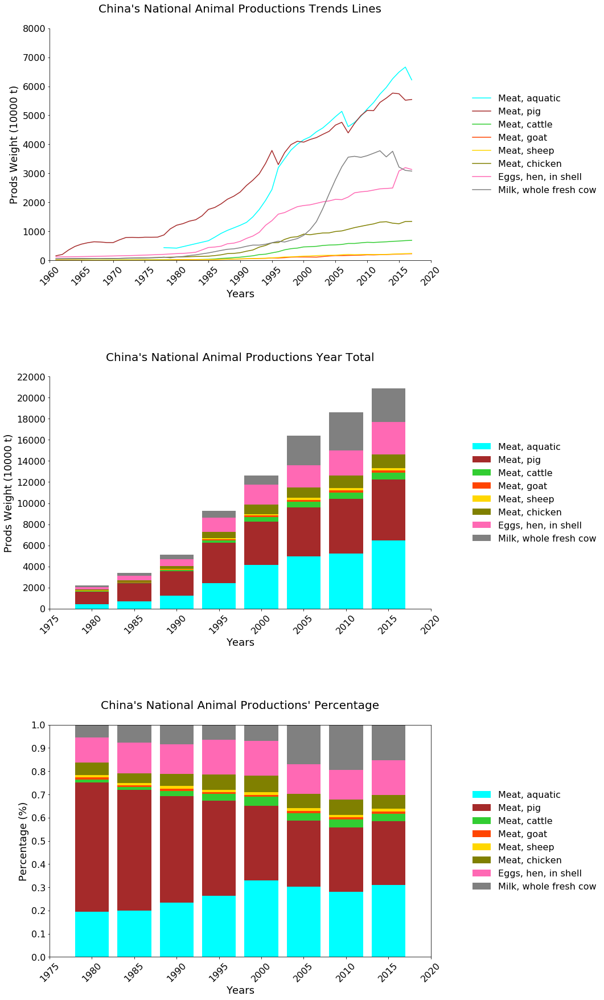

Each Year Total Production = [ 2179.2293    3381.6604    5143.1441    9249.8563   12622.8228
 16381.036132 18619.0491   20899.3798  ]


In [20]:
#---------------------------------------------------------------------------------------------
#                   Create a Plot of China's National Animal Productions                      
#---------------------------------------------------------------------------------------------

fig_size = (12,30)

# set font size
tit_size = 20    # titles
lab_size = 18    # labels
leg_size = 16    # legends
tck_size = 16    # ticklabels

fig = plt.figure(figsize = fig_size)
fig.tight_layout()                          
plt.subplots_adjust(wspace =0.3, hspace =0.5)

# aquatic
df_aqu = df[df['Area']=='China'][['Year', 'AquMeat']]
df_aqu = df_aqu.sort_values(['Year'], ascending=True, axis=0)

# livstocks
df_liv = lives_cn[(lives_cn['Element']=='Production')][['Year','Item','Value']]
# set lines' colors for animal production of livestocks
prods = ('Meat, pig','Meat, cattle','Meat, goat','Meat, sheep','Meat, chicken',
         'Eggs, hen, in shell', 'Milk, whole fresh cow')
colors = (cpg, cca, cgt, csh, cch, 
          ceh, cmc)

dfs_liv = {}
for n in range(0, len(prods)):
    dfs_liv[prods[n]] = df_liv[df_liv['Item']==prods[n]].sort_values(['Year'], ascending=True, axis=0)

# Draw Trends Line-----------------------------------------------------------------------------------------------------------

ax0 = fig.add_subplot(3,1,1)
plt.title("China's National Animal Productions Trends Lines\n", fontsize=tit_size)

# draw a line of aquatic meat production
df_aqu.plot.line(x='Year', color=caq, ax=ax0)

# draw lines of animal productions of livestocks
for n in range(0, len(prods)):
    dfs_liv[prods[n]].plot.line(x='Year', color=colors[n], ax=ax0)
    
ax0.legend(labels=['Meat, aquatic']+list(prods),
           loc='center left', frameon=False, fontsize=leg_size,
           bbox_to_anchor=(1.1,0.5),borderaxespad = 0.)

Xs = range(1960,2025,5)
Ys = range(0, 9000, 1000)
setX_years(ax0, Xs)
setY_wei(ax0, Ys)
setSpi_LB(ax0)



# Draw Stack Bar-----------------------------------------------------------------------------------------------------------

wid = 4
years = list(range(1980,2020,5))
# ------------------------------------------------------------------------------------------------------

ax1 = fig.add_subplot(3,1,2)
plt.title("China's National Animal Productions Year Total\n", fontsize=tit_size)


# draw a bars
plt.bar(years, np.array(df_aqu[df_aqu['Year'].isin(years)]['AquMeat']), 
        color=caq, width=wid)

plt.bar(years, np.array(dfs_liv['Meat, pig'][dfs_liv['Meat, pig']['Year'].isin(years)]['Value']),
        bottom=np.array(df_aqu[df_aqu['Year'].isin(years)]['AquMeat']), 
        color=cpg, width=wid)

bot=np.array(dfs_liv['Meat, pig'][dfs_liv['Meat, pig']['Year'].isin(years)]['Value'].values)\
   +np.array(df_aqu[df_aqu['Year'].isin(years)]['AquMeat'])
for n in range(1, len(prods)):
    plt.bar(years, np.array(dfs_liv[prods[n]][dfs_liv[prods[n]]['Year'].isin(years)]['Value']),
            bottom=bot,
            color=colors[n], width=wid)
    bot=bot + np.array(dfs_liv[prods[n]][dfs_liv[prods[n]]['Year'].isin(years)]['Value'])
    
year_total = bot

ax1.legend(labels=['Meat, aquatic']+list(prods),
           loc='center left', frameon=False, fontsize=leg_size,
           bbox_to_anchor=(1.1,0.5),borderaxespad = 0.)

Xs = range(1975,2025,5)
Ys = range(0, 24000, 2000)
setX_years(ax1, Xs)
setY_wei(ax1, Ys)
setSpi_LB(ax1)


# --------------------------------------------------------------------------------------------------------

ax2 = fig.add_subplot(3,1,3)
plt.title("China's National Animal Productions' Percentage\n", fontsize=tit_size)


# draw a bars
plt.bar(years, np.array(df_aqu[df_aqu['Year'].isin(years)]['AquMeat'])/year_total, 
        color=caq, width=wid)

plt.bar(years, np.array(dfs_liv['Meat, pig'][dfs_liv['Meat, pig']['Year'].isin(years)]['Value'])/year_total,
        bottom=np.array(df_aqu[df_aqu['Year'].isin(years)]['AquMeat'])/year_total, 
        color=cpg, width=wid)

bot=np.array(dfs_liv['Meat, pig'][dfs_liv['Meat, pig']['Year'].isin(years)]['Value'].values)/year_total\
   +np.array(df_aqu[df_aqu['Year'].isin(years)]['AquMeat'])/year_total
for n in range(1, len(prods)):
    plt.bar(years, np.array(dfs_liv[prods[n]][dfs_liv[prods[n]]['Year'].isin(years)]['Value'])/year_total,
            bottom=bot,
            color=colors[n], width=wid)
    bot=bot + np.array(dfs_liv[prods[n]][dfs_liv[prods[n]]['Year'].isin(years)]['Value'])/year_total


ax2.legend(labels=['Meat, aquatic']+list(prods),
           loc='center left', frameon=False, fontsize=leg_size,
           bbox_to_anchor=(1.1,0.5),borderaxespad = 0.)

Xs = range(1975,2025,5)
Ys = np.round(np.linspace(0.00, 1.00, num=11, endpoint=True), decimals=2)
setX_years(ax2, Xs)
setY_per(ax2, Ys)


plt.show()

print('Each Year Total Production =', year_total)

### Animal Producttion in Different Areas of China

#### Create pivot tables 

In [51]:
def mkPivot(df_, val_col, str_year):
    # make a pivot DataFrame for 'val_col': areas as index, years as columns
    df_areas = df_[df_['Area']!='China']
    df_ = pd.pivot_table(df_areas,index=['Area'],columns=['Year'],values=[val_col],aggfunc=[np.sum],margins=1)

    # the result's columns is a multi-index list consists of tuples, so flatten by the last element of each tuple.
    df_.columns.set_names([None, None, None], inplace=True)    # reset multi index name
    df_.columns = df_.columns.get_level_values(-1)
    df_.columns = list(map(str, df_.columns))

    # fix the columns order and name
    fixed_columns = [df_.columns[-1]] + list(df_.columns[:-1])
    df_ = df_[fixed_columns]
    df_.rename(columns = {'All':'HistoricalTotal'}, inplace=True)

    # sort areas by the total number of history
    df_.sort_values([str_year], ascending=False, axis=0, inplace=True)

    # drop 'All' and copy to a new data frame
    df_ = df_.drop(index = 'All')
    
    return df_

In [52]:
productions = ['AquMeat', 'MeatProd_pig', 'MeatProd_cattle', 'MeatProd_gt_shp', 'EggProd', 'MilkProd_cattle']
dfs_prod_hisTot = {}
for item in productions:
    dfs_prod_hisTot[item] = mkPivot(df, item, 'HistoricalTotal')

In [53]:
dfs_prod_hisTot['AquMeat'].head()

,HistoricalTotal,1998,1999,2000,2001,2002,2003,2004,2005,2006,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Area,,,,,,,,,,,,,,,,,,,,,
Shandong,14400.7159,609.34,649.26,652.3496,638.6285,647.4418,652.6248,664.4083,682.3286,692.0402,...,679.2,702.8449,730.7784,762.8875,785.0711,804.0974,837.3113,864.5306,882.7189,801.9686
Guangdong,14131.5554,552.47,573.70,590.7747,607.1517,624.7467,644.9342,661.1632,691.3175,719.3100,...,674.4,695.7190,722.4278,755.3679,781.6353,807.8528,828.1233,849.9246,865.1502,825.3721
Fujian,10882.4824,445.50,466.16,496.1104,507.9223,520.0486,531.0538,546.8862,555.3856,549.8620,...,490.7,511.9771,527.0210,540.7170,557.6107,580.8288,614.3205,644.2178,669.6295,641.2257
Zhejiang,9880.3562,420.73,440.14,466.7919,470.0220,477.4528,478.9624,489.1875,480.3070,481.2206,...,415.3,436.0965,473.5031,511.0080,534.6250,546.0180,569.3470,592.6878,599.0275,586.9903
Jiangsu,8285.5560,281.13,295.82,307.9486,319.7675,333.3257,341.5011,364.3851,386.7872,403.0916,...,422.4,439.8759,457.4495,473.3655,491.3203,506.2926,515.9210,518.1195,517.7374,503.2439


In [54]:
dfs_prod_hisTot['MeatProd_cattle'].head()

,HistoricalTotal,1998,1999,2000,2001,2002,2003,2004,2005,2006,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Area,,,,,,,,,,,,,,,,,,,,,
Henan,1680.669017,76.7,82.2,83.0000,89.225000,89.2000,93.0000,98.3250,100.783000,109.253100,...,84.100000,83.970000,83.046330,82.0000,80.44200,80.560800,82.100000,82.600000,83.013000,35.039787
Shandong,1421.614996,60.1,65.5,69.1800,72.964526,76.1473,79.6500,79.5898,80.721967,81.083000,...,70.674212,69.631723,68.656879,66.2300,66.95853,67.895949,66.605926,67.871439,66.989110,75.928893
Hebei,1268.734196,58.0,61.9,65.2916,68.502300,71.2296,78.5867,82.9053,86.859300,90.036060,...,56.831218,55.262676,58.081073,54.4609,55.30000,52.300000,52.404600,53.190669,54.254482,55.600000
Jilin,842.351752,28.3,31.3,33.5449,35.295200,36.9973,40.2513,48.9700,51.002300,52.999089,...,39.967900,41.820000,43.241880,43.3950,44.95722,45.047134,45.990273,46.588147,47.100617,38.028096
Inner Mongolia,779.249702,17.6,17.8,21.8440,23.214700,19.4890,24.0252,28.7156,33.597300,38.176300,...,43.090200,47.400000,49.708380,49.7300,51.17217,51.786236,54.530907,52.894979,55.592623,59.484107


In [25]:
dfs_prod_hisTot['MeatProd_pig'].head()

,HistoricalTotal,1998,1999,2000,2001,2002,2003,2004,2005,2006,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Area,,,,,,,,,,,,,,,,,,,,,
Sichuan,9421.030339,390.4,405.2,419.1007,441.20000,458.8500,461.6000,480.2000,513.68700,541.303700,...,436.241474,474.194483,492.213873,484.8,496.435200,510.831821,527.177511,512.416541,494.481962,472.230274
Hunan,8204.678352,365.0,364.9,371.7571,389.76916,396.8608,419.3258,429.1177,436.96840,449.625700,...,370.233448,395.409322,412.411923,406.1,427.600000,430.593200,458.100000,448.021800,434.800000,449.600000
Henan,8013.001701,297.9,314.0,322.8812,343.77440,366.4908,386.0000,410.3180,440.82520,470.314100,...,367.100000,389.590818,408.291177,406.4,432.500000,454.125000,478.000000,467.962000,450.647406,466.900000
Shandong,6912.982214,266.6,272.5,285.8800,298.74460,314.8382,332.6371,346.4193,367.05339,380.684700,...,321.342370,341.265597,353.209893,346.9,376.696379,392.894323,406.800000,397.443600,383.533074,427.441088
Hebei,5361.102485,219.1,226.5,242.8362,260.25490,265.1646,290.2523,313.3789,337.36960,352.199322,...,245.775144,253.558906,245.191462,246.6,259.000000,265.285714,281.218000,275.031204,265.405112,291.469920


In [55]:
dfs_prod_hisTot['MeatProd_gt_shp'].head()

,HistoricalTotal,1998,1999,2000,2001,2002,2003,2004,2005,2006,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Area,,,,,,,,,,,,,,,,,,,,,
Inner Mongolia,1410.852156,27.0,29.8,31.8166,32.5724,33.8107,45.3163,60.3598,72.43180,80.992500,...,84.843600,88.200000,89.200000,87.23000,88.625680,88.802931,93.331881,92.591769,98.980602,104.127593
Xinjiang,978.807786,32.5,33.6,37.4966,40.4844,42.6172,45.5438,52.6500,59.89000,66.994124,...,45.968150,43.800000,46.950000,46.43595,48.014772,49.714348,53.610335,55.433086,58.315606,58.241447
Shandong,646.280978,20.9,23.3,24.8000,27.5608,30.2272,32.9275,34.9881,36.35506,36.639398,...,33.210452,32.900000,32.670000,32.48640,33.103642,33.687315,36.011740,37.092092,38.390316,36.027773
Henan,627.877097,28.0,30.0,32.0000,34.5147,37.8465,42.0000,44.6460,46.66120,51.167400,...,26.500000,25.890500,25.200000,24.80000,24.750400,24.758497,25.400000,25.900000,26.443900,26.100000
Hebei,570.163785,21.8,23.4,24.5944,25.5697,26.7059,29.0202,31.0963,33.72790,35.366800,...,26.479663,28.015483,29.305334,28.41150,28.700000,29.051405,30.438600,31.672589,32.365607,30.100000


In [56]:
dfs_prod_hisTot['EggProd'].head()

,HistoricalTotal,1998,1999,2000,2001,2002,2003,2004,2005,2006,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Area,,,,,,,,,,,,,,,,,,,,,
Shandong,7928.625588,322.0,349.1,366.2,379.0377,399.4099,424.6878,432.8712,441.8334,430.5188,...,364.983542,377.117709,384.282945,401.187,401.989374,396.206800,388.02429,423.900000,440.592429,444.778057
Hebei,7582.617429,319.0,338.6,357.0,369.6275,389.4434,415.1898,432.9416,458.9667,465.0866,...,410.998367,353.211997,339.083517,339.837,342.555696,346.060000,362.71280,373.594184,388.537951,383.721654
Henan,7111.274119,229.3,251.8,270.0,286.0045,302.0000,326.2000,347.4000,375.3000,400.8204,...,371.700000,382.850000,388.592750,390.500,404.167500,410.232550,404.00000,410.000000,422.500000,401.181632
Liaoning,4482.978159,131.6,134.4,140.3,148.3621,159.8264,169.5053,192.3857,224.0456,237.4337,...,254.200000,263.097000,275.725656,277.400,279.896600,276.817737,279.30000,276.500000,287.600000,270.432820
Jiangsu,3681.794549,157.1,168.2,181.4,180.1300,187.2500,188.1862,175.3895,182.0050,185.5400,...,172.095800,185.200000,190.570800,194.863,197.201356,197.874300,194.58000,196.230000,198.500000,183.390000


In [57]:
dfs_prod_hisTot['MilkProd_cattle'].head()

,HistoricalTotal,1998,1999,2000,2001,2002,2003,2004,2005,2006,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Area,,,,,,,,,,,,,,,,,,,,,
Inner Mongolia,11943.271027,63.8,67.9,79.7774,106.23650,165.1996,308.0222,497.8733,691.0481,869.1631,...,912.234900,903.100000,905.177130,908.200000,910.202000,767.298600,788.015662,803.20000,734.124800,552.857835
Heilongjiang,8296.825224,142.1,142.8,154.2992,188.98430,235.7546,300.4701,374.4782,440.2393,460.3045,...,508.359800,528.700000,552.491500,543.102467,559.938644,518.226566,556.575332,570.47834,545.947772,465.214803
Hebei,6719.872430,55.8,68.4,84.1984,107.37840,136.8887,197.9021,266.4643,340.3456,407.6186,...,504.511866,451.500000,439.761000,458.895400,470.367785,458.000000,487.770000,473.13690,440.490454,381.005725
Shandong,3759.030016,27.5,35.6,45.7300,61.78123,90.3023,124.3868,160.8798,187.0747,215.8000,...,230.512793,236.275613,253.051181,268.866880,283.923425,271.430795,279.600000,275.38000,268.395660,223.543880
Henan,3683.496692,7.8,10.3,16.0972,27.02470,36.0001,49.6000,74.5000,104.0000,147.6800,...,279.100000,281.891000,290.911512,306.600000,316.104600,316.416100,332.000000,342.20000,326.801000,202.857581


#### Draw Bar Charts

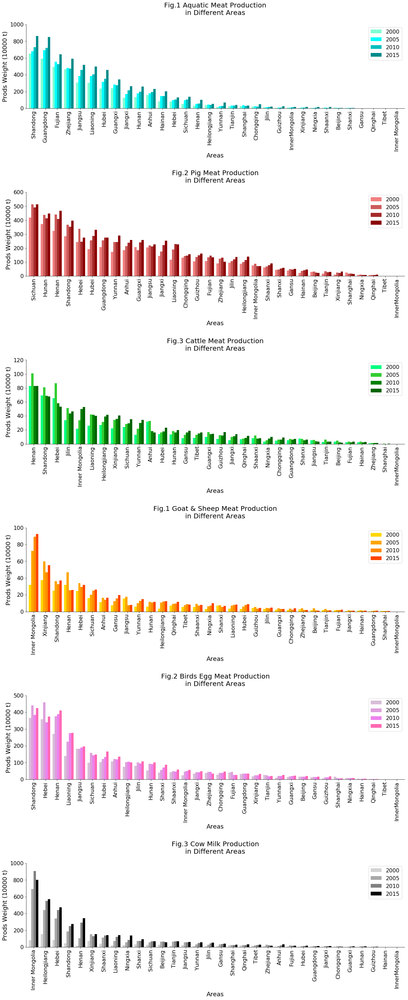

In [59]:
# --------------------------------------------------------------------------------------------#
# Create Plots of Historical Total Hog Stock, Outputs, Meat Yeilds in Different Areas         #
# --------------------------------------------------------------------------------------------#

# Bar ---------------------------------------------------------------------------------------#

fig_size = (20,50)

tit_size = 20    # titles
lab_size = 18    # labels
leg_size = 16    # legends
tck_size = 16    # ticklabels
wid = 0.8        # bar width

fig = plt.figure(figsize = fig_size)
fig.tight_layout()                          # adjust layout to tight
plt.subplots_adjust(wspace =0.5, hspace =1) # adjust white space

caqs = ['aquamarine', 'cyan', 'c', 'darkcyan']
cpgs = ['lightcoral', 'indianred', 'brown', 'darkred']
ccas = ['springgreen', 'limegreen', 'g', 'darkgreen']
cgss = ['gold', 'orange', 'darkorange', 'orangered']
cegs = ['thistle', 'plum', 'violet', 'hotpink']
cmks = ['lightgrey','darkgrey', 'grey', 'k']

years = list(map(str,range(2000, 2020, 5)))

# -------------------------------------------------------------------------------------------------------------
ax0 = fig.add_subplot(6,1,1)
plt.title("Fig.1 Aquatic Meat Production\nin Different Areas\n", fontsize=tit_size)
dfs_prod_hisTot['AquMeat'][years].reset_index().plot.bar(x='Area', width=wid, color=caqs, ax=ax0)

areas=dfs_prod_hisTot['AquMeat'].index.values.tolist()
setX_areas(ax0, areas)
Ys = range(0,1200,200)
setY_wei(ax0, Ys)

# -------------------------------------------------------------------------------------------------------------
ax1 = fig.add_subplot(6,1,2)
plt.title("Fig.2 Pig Meat Production\nin Different Areas\n", fontsize=tit_size)
dfs_prod_hisTot['MeatProd_pig'][years].reset_index().plot.bar(x='Area', width=wid, color=cpgs, ax=ax1)

areas=dfs_prod_hisTot['MeatProd_pig'].index.values.tolist()
setX_areas(ax1, areas)
Ys = range(0,700,100)
setY_wei(ax1, Ys)

# -------------------------------------------------------------------------------------------------------------
ax2 = fig.add_subplot(6,1,3)
plt.title("Fig.3 Cattle Meat Production\nin Different Areas\n", fontsize=tit_size)
dfs_prod_hisTot['MeatProd_cattle'][years].reset_index().plot.bar(x='Area', width=wid, color=ccas, ax=ax2)

areas=dfs_prod_hisTot['MeatProd_cattle'].index.values.tolist()
setX_areas(ax2, areas)
Ys = range(0,140,20)
setY_wei(ax2, Ys)

# -------------------------------------------------------------------------------------------------------------
ax3 = fig.add_subplot(6,1,4)
plt.title("Fig.1 Goat & Sheep Meat Production\nin Different Areas\n", fontsize=tit_size)
dfs_prod_hisTot['MeatProd_gt_shp'][years].reset_index().plot.bar(x='Area', width=wid, color=cgss, ax=ax3)

areas=dfs_prod_hisTot['MeatProd_gt_shp'].index.values.tolist()
setX_areas(ax3, areas)
Ys = range(0,120,20)
setY_wei(ax3, Ys)

# -------------------------------------------------------------------------------------------------------------
ax4 = fig.add_subplot(6,1,5)
plt.title("Fig.2 Birds Egg Meat Production\nin Different Areas\n", fontsize=tit_size)
dfs_prod_hisTot['EggProd'][years].reset_index().plot.bar(x='Area', width=wid, color=cegs, ax=ax4)

areas=dfs_prod_hisTot['EggProd'].index.values.tolist()
setX_areas(ax4, areas)
Ys = range(0,600,100)
setY_wei(ax4, Ys)

# -------------------------------------------------------------------------------------------------------------
ax5 = fig.add_subplot(6,1,6)
plt.title("Fig.3 Cow Milk Production\nin Different Areas\n", fontsize=tit_size)
dfs_prod_hisTot['MilkProd_cattle'][years].reset_index().plot.bar(x='Area', width=wid, color=cmks, ax=ax5)

areas=dfs_prod_hisTot['MilkProd_cattle'].index.values.tolist()
setX_areas(ax5, areas)
Ys = range(0,1200,200)
setY_wei(ax5, Ys)


for ax in [ax0,ax1,ax2,ax3,ax4,ax5]:
    setSpi_LB(ax)
    ax.legend(fontsize=leg_size)

plt.show()

#### Draw Geo Maps of the Animal Producttion in Different Areas of China

In [60]:
import folium
import json
import time
# import folium.colormap as cm

cn_geo = r'cn_provinces.geojson'

def mkMap(df_, ind_name, val_col, color, leg_name):

    df_temp=df_.reset_index()
# ---------------------------------------------------------------------------------- #
    # 在该字段的所有年份的数据范围内选择最大值和最小值 #
# ---------------------------------------------------------------------------------- #

#     df_array = np.array(df_temp.drop(['AreaName', 'HistoricalTotal'], axis=1))
#     threshold_scale = np.linspace(df_array.min(),
#                                   df_array.max(),
#                                   6, dtype=int)
    
# ---------------------------------------------------------------------------------- #
# --------- 仅使用当前年份数据选择最大值和最小值 ------------------------ #
# ---------------------------------------------------------------------------------- #

    threshold_scale = np.linspace(df_temp[val_col].min(),
                                  df_temp[val_col].max(),
                                  6, dtype=int)
    
    # change the numpy array to a list
    threshold_scale = threshold_scale.tolist()

    # make sure that the last value of the list is greater than the maximum immigration
    threshold_scale[-1] = threshold_scale[-1] + 1

    # let Folium determine the scale.
    cn_map = folium.Map(
        width=1000,height=600,
        location=[40, 105], 
        zoom_start=4, 
        tiles='Mapbox Bright')

    cn_map.choropleth(
        geo_data=cn_geo,
        data=df_temp,
        columns=[ind_name, val_col],
        key_on='feature.properties.NAME',   # must be 'feature', not 'features'
        threshold_scale=threshold_scale,
        fill_color=color, 
        fill_opacity=0.9, 
        line_opacity=0.2,
        highlight=True,
        legend_name=leg_name,
        reset=True
    )
    return cn_map

**The newest data comes from 2017, so we use 2017's data to draw data map.**

In [61]:
year = '2017'

In [62]:
productions = ['AquMeat', 'MeatProd_pig', 'MeatProd_cattle', 'MeatProd_gt_shp', 'EggProd', 'MilkProd_cattle']
dfs_prod_year = {}
for item in productions:
    dfs_prod_year[item] = mkPivot(df, item, year)

In [63]:
mkMap(dfs_prod_year['AquMeat'], 'Area', year, 'GnBu', year+' Aquatic Meat Productions Weight (Unit: 10000 t)')

In [64]:
mkMap(dfs_prod_year['MeatProd_pig'], 'Area', year, 'OrRd', year+' Pig Meat Productions Weight (Unit: 10000 t)')

In [65]:
mkMap(dfs_prod_year['MeatProd_cattle'], 'Area', year, 'YlGn', year+' Cattle Meat Productions Weight (Unit: 10000 t)')

In [66]:
mkMap(dfs_prod_year['MeatProd_gt_shp'], 'Area', year, 'YlOrBr', year+' Goats & Sheep Meat Productions Weight (Unit: 10000 t)')

In [67]:
mkMap(dfs_prod_year['EggProd'], 'Area', year, 'RdPu', year+' Birds Egg Productions Weight (Unit: 10000 t)')

In [68]:
mkMap(dfs_prod_year['MilkProd_cattle'], 'Area', year, 'BuPu', year+' Cow Milk Productions Weight (Unit: 10000 t)')

In [69]:
# !pip install matplotlib-venn

In [81]:
top_aqu = np.array(dfs_prod_year['AquMeat'].head(7).index.values)
top_pig = np.array(dfs_prod_year['MeatProd_pig'].head(13).index.values)
top_cattle = np.array(dfs_prod_year['MeatProd_cattle'].head(9).index.values)
top_gt_shp = np.array(dfs_prod_year['MeatProd_gt_shp'].head(2).index.values)
top_egg = np.array(dfs_prod_year['EggProd'].head(5).index.values)
top_milk = np.array(dfs_prod_year['MilkProd_cattle'].head(4).index.values)

In [85]:
print('Top areas for producing animal products (arranged in order):\n')
print('Aquatic meat: \n{}.\n'.format(', '.join(top_aqu)))
print('Pig meat: \n{}.\n'.format(', '.join(top_pig)))
print('Cattle meat: \n{}.\n'.format(', '.join(top_cattle)))
print('Goat & sheep meat: \n{}.\n'.format(', '.join(top_gt_shp)))
print('Birds egg: \n{}.\n'.format(', '.join(top_egg)))
print('Cow milk: \n{}.\n'.format(', '.join(top_milk)))

Top areas for producing animal products (arranged in order):

Aquatic meat: 
Guangdong, Shandong, Fujian, Zhejiang, Jiangsu, Hubei, Liaoning.

Pig meat: 
Sichuan, Henan, Hunan, Shandong, Hubei, Yunnan, Hebei, Guangdong, Guangxi, Jiangxi, Anhui, Liaoning, Jiangsu.

Cattle meat: 
Shandong, Inner Mongolia, Hebei, Heilongjiang, Xinjiang, Jilin, Yunnan, Henan, Sichuan.

Goat & sheep meat: 
Inner Mongolia, Xinjiang.

Birds egg: 
Shandong, Henan, Hebei, Liaoning, Jiangsu.

Cow milk: 
Inner Mongolia, Heilongjiang, Hebei, Shandong.



In [86]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2, venn3, venn3_circles

In [88]:
set_top_aqu = set(top_aqu)
set_top_pig = set(top_pig)
set_top_cattle = set(top_cattle)
set_top_gt_shp = set(top_gt_shp)
set_top_egg = set(top_egg)
set_top_milk = set(top_milk)

In [90]:
set_top_meat = (set_top_pig.union(set_top_cattle)).union(set_top_gt_shp)
set_top_aq_eg_mk = (set_top_aqu.union(set_top_egg)).union(set_top_milk)
print('Top areas for producing meat: \n{}.\n'.format(', '.join(set_top_meat)))
print('Top areas for producing aquatic, egg and milk: \n{}.\n'.format(', '.join(set_top_aq_eg_mk)))

Top areas for producing meat: 
Shandong, Hunan, Guangdong, Inner Mongolia, Yunnan, Hubei, Jiangxi, Heilongjiang, Xinjiang, Hebei, Sichuan, Jiangsu, Jilin, Henan, Anhui, Guangxi, Liaoning.

Top areas for producing aquatic, egg and milk: 
Shandong, Jiangsu, Guangdong, Inner Mongolia, Henan, Hubei, Fujian, Heilongjiang, Liaoning, Zhejiang, Hebei.



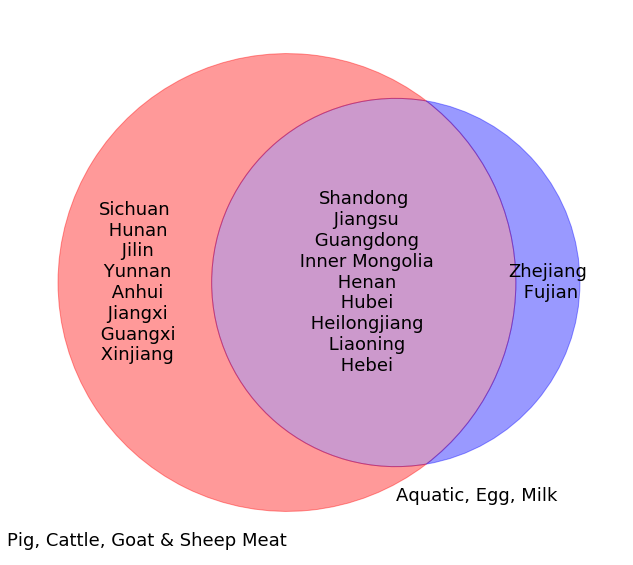

In [91]:
fig_size = (16, 10)
fig = plt.figure(figsize=fig_size)
v0 = venn2([set_top_meat, set_top_aq_eg_mk], ('Pig, Cattle, Goat & Sheep Meat', 'Aquatic, Egg, Milk'))

try:
    v0.get_patch_by_id('10').set_color('red')
except:pass
try:
    v0.get_patch_by_id('01').set_color('blue')
except:pass
try:
    v0.get_patch_by_id('11').set_color('purple')
except:pass

try:
    v0.get_label_by_id('10').set_text('\n '.join(set_top_meat.difference(set_top_aq_eg_mk)))
except:pass
try:
    v0.get_label_by_id('01').set_text('\n '.join(set_top_aq_eg_mk.difference(set_top_meat)))
except:pass
try:
    v0.get_label_by_id('11').set_text('\n '.join(set_top_aq_eg_mk.intersection(set_top_meat)))
except:pass

for text in v0.subset_labels:
    try:
        text.set_fontsize(18)
    except:
        continue

for text in v0.set_labels:
    try:
        text.set_fontsize(18)
    except:
        continue

plt.show()

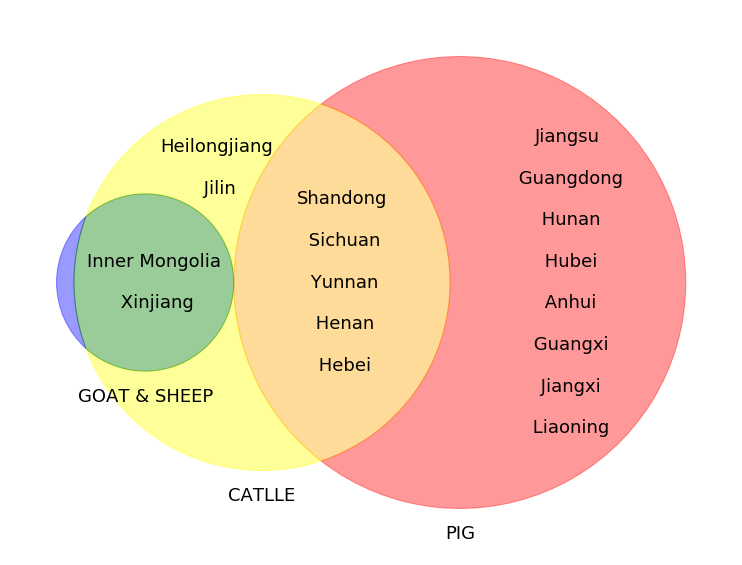

In [92]:
fig_size = (20, 10)
fig = plt.figure(figsize=fig_size)
v1 = venn3([set_top_pig, set_top_cattle, set_top_gt_shp], ('PIG', 'CATLLE', 'GOAT & SHEEP'))

try:
    v1.get_patch_by_id('100').set_color('red')
except:pass
try:
    v1.get_patch_by_id('010').set_color('yellow')
except:pass
try:
    v1.get_patch_by_id('001').set_color('blue')
except:pass
try:    
    v1.get_patch_by_id('110').set_color('orange')
except:pass
try:    
    v1.get_patch_by_id('101').set_color('purple')
except:pass
try:    
    v1.get_patch_by_id('011').set_color('green')
except:pass
try:    
    v1.get_patch_by_id('111').set_color('grey')
except:pass
    
try:    
    v1.get_label_by_id('100').set_text('\n\n '.join(set_top_pig.difference(set_top_cattle.union(set_top_gt_shp))))
except:pass  
try:
    v1.get_label_by_id('010').set_text('\n\n '.join(set_top_cattle.difference(set_top_pig.union(set_top_gt_shp)))+'\n\n\n\n\n\n\n\n\n\n\n')
except:pass
try:
    v1.get_label_by_id('001').set_text('\n\n '.join(set_top_gt_shp.difference(set_top_cattle.union(set_top_pig))))
except:pass
try:
    v1.get_label_by_id('110').set_text('\n\n '.join((set_top_pig.intersection(set_top_cattle)).difference(set_top_gt_shp)))
except:pass
try:
    v1.get_label_by_id('101').set_text('\n\n '.join((set_top_pig.intersection(set_top_gt_shp)).difference(set_top_cattle)))
except:pass
try:
    v1.get_label_by_id('011').set_text('\n\n '.join((set_top_gt_shp.intersection(set_top_cattle)).difference(set_top_pig)))
except:pass
try:
    v1.get_label_by_id('111').set_text('\n\n '.join(((set_top_pig.intersection(set_top_cattle)).intersection(set_top_gt_shp))))
except:pass

for text in v1.subset_labels:
    try:
        text.set_fontsize(18)
    except:continue

for text in v1.set_labels:
    try:
        text.set_fontsize(18)
    except:continue

plt.show()

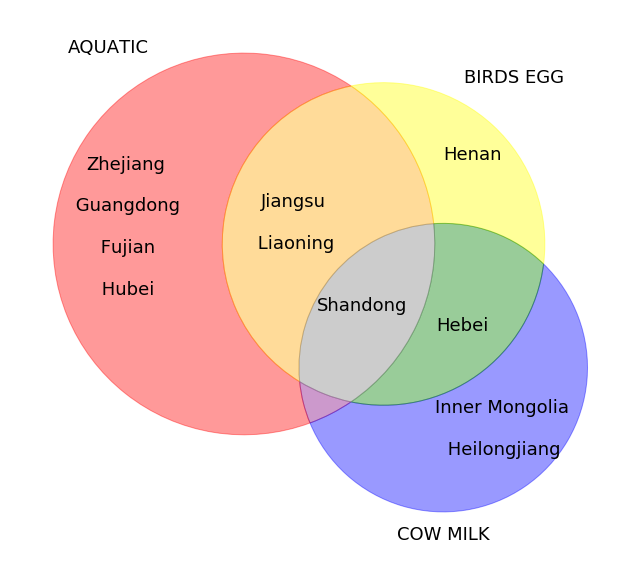

In [94]:
fig_size = (16, 10)
fig = plt.figure(figsize=fig_size)
v2=venn3([set_top_aqu, set_top_egg, set_top_milk], ('AQUATIC', 'BIRDS EGG', 'COW MILK'))

try:
    v2.get_patch_by_id('100').set_color('red')
except:pass
try:
    v2.get_patch_by_id('010').set_color('yellow')
except:pass
try:
    v2.get_patch_by_id('001').set_color('blue')
except:pass
try:
    v2.get_patch_by_id('110').set_color('orange')
except:pass
try:
    v2.get_patch_by_id('101').set_color('purple')
except:pass
try:
    v2.get_patch_by_id('011').set_color('green')
except:pass
try:
    v2.get_patch_by_id('111').set_color('grey')
except:pass

try:
    v2.get_label_by_id('100').set_text('\n\n '.join(set_top_aqu.difference(set_top_egg.union(set_top_milk))))
except:pass
try:
    v2.get_label_by_id('010').set_text('\n\n '.join(set_top_egg.difference(set_top_aqu.union(set_top_milk))))
except:pass
try:
    v2.get_label_by_id('001').set_text('\n\n '.join(set_top_milk.difference(set_top_egg.union(set_top_aqu)))+'\n\n')
except:pass
try:
    v2.get_label_by_id('110').set_text('\n\n '.join((set_top_aqu.intersection(set_top_egg)).difference(set_top_milk)))
except:pass
try:
    v2.get_label_by_id('101').set_text('\n\n '.join((set_top_aqu.intersection(set_top_milk)).difference(set_top_egg)))
except:pass
try:
    v2.get_label_by_id('011').set_text(('\n\n '.join((set_top_egg.intersection(set_top_milk)).difference(set_top_aqu))))
except:pass
try:
    v2.get_label_by_id('111').set_text('\n\n '.join(((set_top_aqu.intersection(set_top_egg)).intersection(set_top_milk))))
except:pass

for text in v2.subset_labels:
    try:
        text.set_fontsize(18)
    except:continue

for text in v2.set_labels:
    try:
        text.set_fontsize(18)
    except:continue

plt.show()

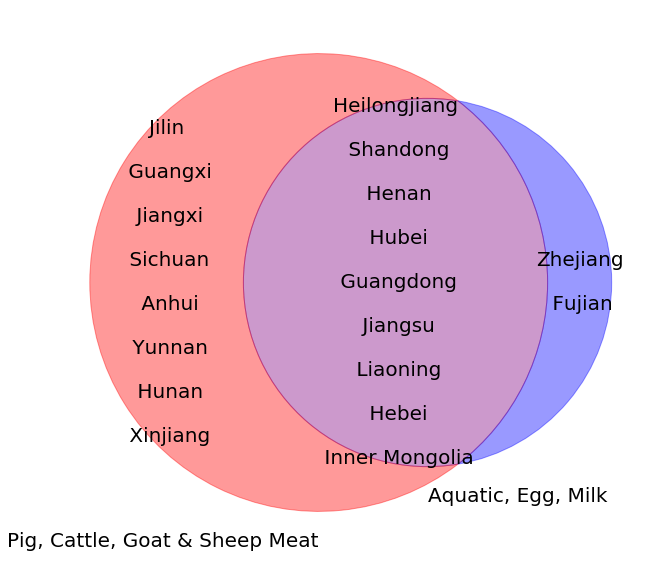

In [117]:
fig_size = (16, 10)
fig = plt.figure(figsize=fig_size)
v0 = venn2([top_meat, top_aq_eg_mk], ('Pig, Cattle, Goat & Sheep Meat', 'Aquatic, Egg, Milk'))

try:
    v0.get_patch_by_id('10').set_color('red')
except:pass
try:
    v0.get_patch_by_id('01').set_color('blue')
except:pass
try:
    v0.get_patch_by_id('11').set_color('purple')
except:pass

try:
    v0.get_label_by_id('10').set_text('\n\n '.join(top_meat.difference(top_aq_eg_mk)))
except:pass
try:
    v0.get_label_by_id('01').set_text('\n\n '.join(top_aq_eg_mk.difference(top_meat)))
except:pass
try:
    v0.get_label_by_id('11').set_text('\n\n '.join(top_aq_eg_mk.intersection(top_meat)))
except:pass

for text in v0.subset_labels:
    try:
        text.set_fontsize(20)
    except:
        continue

for text in v0.set_labels:
    try:
        text.set_fontsize(20)
    except:
        continue

plt.show()

### The Stocks, Slaughtered Animals, and Unit Meat Yields of National China

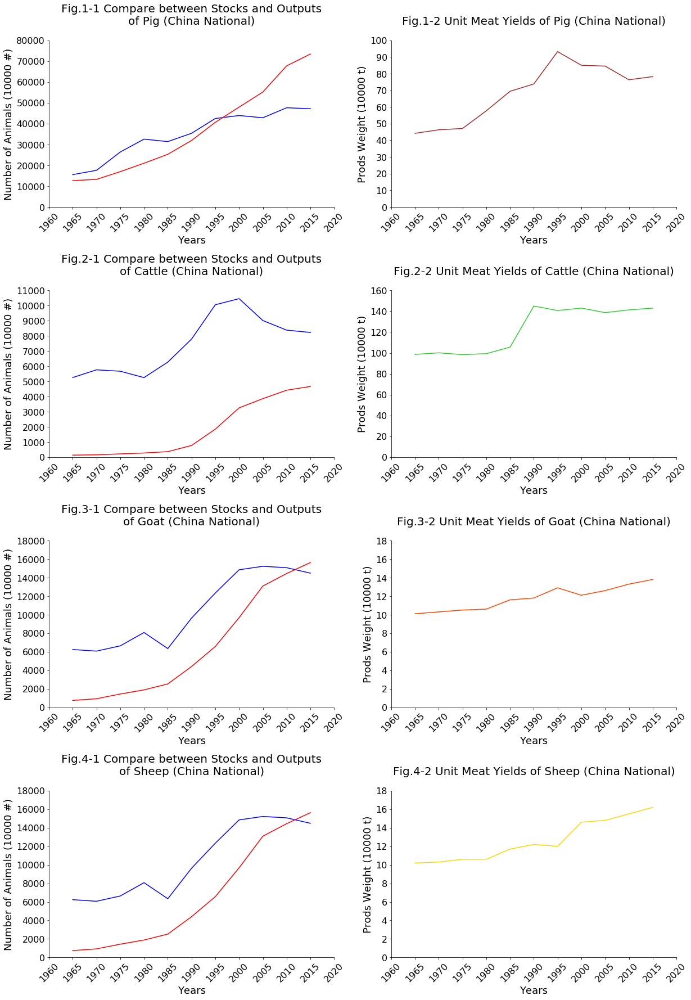

In [29]:
fig_size = (20, 30)

fig = plt.figure(figsize=fig_size)
fig.tight_layout()                          
plt.subplots_adjust(wspace =0.2, hspace =0.5)


#-----------------------------------------------------------------------------------------------#
# Create Subplots of Comparison between the Stocks and Outputs in Hog, Cattle, and Goat&Sheep   #
#-----------------------------------------------------------------------------------------------#


years = list(range(1960,2025,5))
# Fig.1-1 -----------------------------------------------------------------------------------------

ax0 = fig.add_subplot(4,2,1)
plt.title("Fig.1-1 Compare between Stocks and Outputs\nof Pig (China National)\n", fontsize=tit_size)

lives_cn_pig_stock=lives_cn[(lives_cn['Element']=='Stocks')&(lives_cn['Item']=='Pigs')&(lives_cn['Year'].isin(years))][['Year','Value']]
lives_cn_pig_slau=lives_cn[(lives_cn['Element']=='Producing Animals/Slaughtered')&(lives_cn['Item']=='Meat, pig')&(lives_cn['Year'].isin(years))][['Year','Value']]

plt.plot(np.array(lives_cn_pig_stock['Year']), np.array(lives_cn_pig_stock['Value']), color='blue')
plt.plot(np.array(lives_cn_pig_slau['Year']), np.array(lives_cn_pig_slau['Value']), color='red')

Xs = range(1960,2025,5)
Ys = range(0,90000,10000)
setX_years(ax0, Xs)
setY_num(ax0, Ys)
setSpi_LB(ax0)

# Fig.1-2 -----------------------------------------------------------------------------------------

ax1 = fig.add_subplot(4,2,2)
plt.title("Fig.1-2 Unit Meat Yields of Pig (China National)\n",fontsize=tit_size)

lives_cn_pig_yield=lives_cn[(lives_cn['Element']=='Yield/Carcass Weight')&(lives_cn['Item']=='Meat, pig')&(lives_cn['Year'].isin(years))][['Year','Value']]

plt.plot(np.array(lives_cn_pig_yield['Year']), np.array(lives_cn_pig_yield['Value']), color=cpg)

Xs = range(1960,2025,5)
Ys = range(0,110,10)
setX_years(ax1, Xs)
setY_wei(ax1, Ys)
setSpi_LB(ax1)

# Fig.2-1 -----------------------------------------------------------------------------------------

ax2 = fig.add_subplot(4,2,3)
plt.title("Fig.2-1 Compare between Stocks and Outputs\nof Cattle (China National)\n", fontsize=tit_size)

lives_cn_cattle_stock=lives_cn[(lives_cn['Element']=='Stocks')&(lives_cn['Item']=='Cattle')&(lives_cn['Year'].isin(years))][['Year','Value']]
lives_cn_cattle_slau=lives_cn[(lives_cn['Element']=='Producing Animals/Slaughtered')&(lives_cn['Item']=='Meat, cattle')&(lives_cn['Year'].isin(years))][['Year','Value']]

plt.plot(np.array(lives_cn_cattle_stock['Year']), np.array(lives_cn_cattle_stock['Value']), color='blue')
plt.plot(np.array(lives_cn_cattle_slau['Year']), np.array(lives_cn_cattle_slau['Value']), color='red')

Xs = range(1960,2025,5)
Ys = range(0,12000,1000)
setX_years(ax2, Xs)
setY_num(ax2, Ys)
setSpi_LB(ax2)

# Fig.2-2 -----------------------------------------------------------------------------------------

ax3 = fig.add_subplot(4,2,4)
plt.title("Fig.2-2 Unit Meat Yields of Cattle (China National)\n",fontsize=tit_size)

lives_cn_cattle_yield=lives_cn[(lives_cn['Element']=='Yield/Carcass Weight')&(lives_cn['Item']=='Meat, cattle')&(lives_cn['Year'].isin(years))][['Year','Value']]

plt.plot(np.array(lives_cn_cattle_yield['Year']), np.array(lives_cn_cattle_yield['Value']), color=cca)

Xs = range(1960,2025,5)
Ys = range(0,180,20)
setX_years(ax3, Xs)
setY_wei(ax3, Ys)
setSpi_LB(ax3)


# Fig.3-1 -----------------------------------------------------------------------------------------

ax4 = fig.add_subplot(4,2,5)
plt.title("Fig.3-1 Compare between Stocks and Outputs\nof Goat (China National)\n", fontsize=tit_size)

lives_cn_goat_stock=lives_cn[(lives_cn['Element']=='Stocks')&(lives_cn['Item']=='Goats')&(lives_cn['Year'].isin(years))][['Year','Value']]
lives_cn_goat_slau=lives_cn[(lives_cn['Element']=='Producing Animals/Slaughtered')&(lives_cn['Item']=='Meat, goat')&(lives_cn['Year'].isin(years))][['Year','Value']]

plt.plot(np.array(lives_cn_goat_stock['Year']), np.array(lives_cn_goat_stock['Value']), color='blue')
plt.plot(np.array(lives_cn_goat_slau['Year']), np.array(lives_cn_goat_slau['Value']), color='red')

Xs = range(1960,2025,5)
Ys = range(0,20000,2000)
setX_years(ax4, Xs)
setY_num(ax4, Ys)
setSpi_LB(ax4)

# Fig.3-2 -----------------------------------------------------------------------------------------

ax5 = fig.add_subplot(4,2,6)
plt.title("Fig.3-2 Unit Meat Yields of Goat (China National)\n",fontsize=tit_size)

lives_cn_goat_yield=lives_cn[(lives_cn['Element']=='Yield/Carcass Weight')&(lives_cn['Item']=='Meat, goat')&(lives_cn['Year'].isin(years))][['Year','Value']]

plt.plot(np.array(lives_cn_goat_yield['Year']), np.array(lives_cn_goat_yield['Value']), color=cgt)

Xs = range(1960,2025,5)
Ys = range(0,20,2)
setX_years(ax5, Xs)
setY_wei(ax5, Ys)
setSpi_LB(ax5)


# Fig.4-1 -----------------------------------------------------------------------------------------

ax6 = fig.add_subplot(4,2,7)
plt.title("Fig.4-1 Compare between Stocks and Outputs\nof Sheep (China National)\n", fontsize=tit_size)

lives_cn_sheep_stock=lives_cn[(lives_cn['Element']=='Stocks')&(lives_cn['Item']=='Sheep')&(lives_cn['Year'].isin(years))][['Year','Value']]
lives_cn_sheep_slau=lives_cn[(lives_cn['Element']=='Producing Animals/Slaughtered')&(lives_cn['Item']=='Meat, sheep')&(lives_cn['Year'].isin(years))][['Year','Value']]

plt.plot(np.array(lives_cn_goat_stock['Year']), np.array(lives_cn_goat_stock['Value']), color='blue')
plt.plot(np.array(lives_cn_goat_slau['Year']), np.array(lives_cn_goat_slau['Value']), color='red')

Xs = range(1960,2025,5)
Ys = range(0,20000,2000)
setX_years(ax6, Xs)
setY_num(ax6, Ys)
setSpi_LB(ax6)

# Fig.4-2 -----------------------------------------------------------------------------------------

ax7 = fig.add_subplot(4,2,8)
plt.title("Fig.4-2 Unit Meat Yields of Sheep (China National)\n",fontsize=tit_size)

lives_cn_sheep_yield=lives_cn[(lives_cn['Element']=='Yield/Carcass Weight')&(lives_cn['Item']=='Meat, sheep')&(lives_cn['Year'].isin(years))][['Year','Value']]

plt.plot(np.array(lives_cn_sheep_yield['Year']), np.array(lives_cn_sheep_yield['Value']), color=csh)

Xs = range(1960,2025,5)
Ys = range(0,20,2)
setX_years(ax7, Xs)
setY_wei(ax7, Ys)
setSpi_LB(ax7)

plt.show()

### Unit Meat Yields in Different Areas of China

#### Create Pivot Tables

In [35]:
yields = ['MeatYield_pig', 'MeatYield_cattle', 'MeatYield_gt_shp']
dfs_yields = {}
for item in yields:
    dfs_yields[item] = mkPivot(df, item)

In [37]:
dfs_yields['MeatYield_pig'].head()

,HistoricalTotal,1998,1999,2000,2001,2002,2003,2004,2005,2006,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Area,,,,,,,,,,,,,,,,,,,,,
Guizhou,1789.304230,90.892159,89.963834,90.002653,90.600000,89.660311,90.787450,90.340402,94.030315,92.236470,...,86.223786,87.776455,87.693491,87.763219,90.000922,89.358613,89.715868,89.540819,88.078928,87.718818
Liaoning,1713.466708,92.164393,92.176021,88.599998,88.599227,85.965450,86.355149,83.385756,83.081334,84.160860,...,84.235860,84.251059,85.148214,85.177784,84.365805,83.870022,84.630556,84.881826,84.011243,84.081912
Anhui,1687.287114,82.023576,83.113855,83.000000,83.000000,82.000000,82.000000,82.000000,82.000000,85.000000,...,86.016215,85.739550,85.822151,85.653575,85.280909,85.280909,85.718684,86.971933,85.169406,85.785972
Inner Mongolia,1683.726402,92.644085,92.624554,90.000000,89.972323,89.311431,90.000000,92.246872,91.460030,90.690993,...,77.640436,77.688814,78.664616,78.775826,78.624188,78.706784,78.810754,78.810754,79.278011,80.007491
Yunnan,1683.129444,78.141225,83.397604,84.905964,86.000084,86.669395,87.550688,88.299986,89.328609,89.780810,...,81.274036,81.721898,81.885560,82.253973,83.040630,83.030033,83.621977,83.621977,83.963640,84.360906


In [38]:
dfs_yields['MeatYield_cattle'].head()

,HistoricalTotal,1998,1999,2000,2001,2002,2003,2004,2005,2006,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Area,,,,,,,,,,,,,,,,,,,,,
Shanghai,3698.495495,0.0,400.000000,0.000000,0.000000,162.162162,400.000000,0.000000,233.333333,0.000000,...,0.000000,600.000000,0.000000,0.000000,370.000000,0.000000,500.000000,500.000000,533.000000,0.0
Jiangsu,3509.056554,0.0,185.581727,186.678819,187.403954,187.004205,186.722408,186.123813,185.913383,348.336545,...,186.050157,186.285714,185.912346,184.803719,184.516472,184.469329,185.626136,185.318893,182.941176,0.0
Beijing,3285.830617,0.0,177.777778,189.235669,175.187773,183.588213,173.585791,175.738950,178.312958,211.428571,...,178.899160,178.558597,183.724410,183.956140,182.659933,183.035714,184.782609,184.059524,183.792432,0.0
Tianjin,3093.051421,0.0,141.402715,151.816193,163.347222,163.143573,164.981718,164.979314,164.982818,269.060725,...,168.524966,168.967158,171.129210,171.111111,171.398528,171.727749,173.195876,173.142857,171.874866,0.0
Hebei,2926.203532,0.0,152.234328,151.844461,151.232559,148.388817,149.197312,148.615757,149.948728,258.138307,...,160.499359,160.493354,160.800313,160.661101,162.489349,160.774670,163.457891,163.462412,163.466352,0.0


In [39]:
dfs_yields['MeatYield_gt_shp'].head()

,HistoricalTotal,1998,1999,2000,2001,2002,2003,2004,2005,2006,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Area,,,,,,,,,,,,,,,,,,,,,
Tianjin,428.054991,0.0,20.905066,20.897328,22.445672,22.700818,21.868024,21.885810,21.699379,46.971534,...,22.576706,22.567856,22.488024,22.586024,22.611906,22.928505,23.397914,23.469388,23.518169,0.0
Guizhou,365.166561,0.0,24.841472,25.458996,24.232701,22.399387,20.102356,20.173674,19.628202,37.697635,...,17.018866,16.991057,17.111223,17.079722,17.071283,17.073157,17.024974,17.066233,17.045093,0.0
Guangdong,334.353695,0.0,21.337127,19.691050,19.487395,19.492265,19.298674,18.498675,17.600496,18.715365,...,18.242783,18.229058,18.408141,18.212247,17.837838,17.802277,17.820177,17.946299,17.815892,0.0
Yunnan,319.267387,0.0,17.997750,17.571675,17.200185,17.230629,17.377290,17.460194,17.781825,20.748777,...,17.600012,17.566710,17.660751,17.716803,17.665954,17.667556,18.030929,17.530741,17.362735,0.0
Xinjiang,315.759991,0.0,18.454339,18.586965,18.853630,18.034904,17.337206,18.867384,19.432944,21.753952,...,16.173098,15.931502,15.930266,15.936396,15.998311,15.998181,16.110811,16.095086,16.141388,0.0
